In [2]:
# Travel.csv

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mlp
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab 
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline 
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn import metrics

In [3]:
data=pd.read_csv("Travel.csv")

In [4]:
data.head()

,CustomerID,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
0,200000,1,41.0,Self Enquiry,3,6.0,Salaried,Female,3,3.0,Deluxe,3.0,Single,1.0,1,2,1,0.0,Manager,20993.0
1,200001,0,49.0,Company Invited,1,14.0,Salaried,Male,3,4.0,Deluxe,4.0,Divorced,2.0,0,3,1,2.0,Manager,20130.0
2,200002,1,37.0,Self Enquiry,1,8.0,Free Lancer,Male,3,4.0,Basic,3.0,Single,7.0,1,3,0,0.0,Executive,17090.0
3,200003,0,33.0,Company Invited,1,9.0,Salaried,Female,2,3.0,Basic,3.0,Divorced,2.0,1,5,1,1.0,Executive,17909.0
4,200004,0,NaN,Self Enquiry,1,8.0,Small Business,Male,2,3.0,Basic,4.0,Divorced,1.0,0,5,1,0.0,Executive,18468.0


In [5]:
data.shape


(4888, 20)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4888 entries, 0 to 4887
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CustomerID                4888 non-null   int64  
 1   ProdTaken                 4888 non-null   int64  
 2   Age                       4662 non-null   float64
 3   TypeofContact             4863 non-null   object 
 4   CityTier                  4888 non-null   int64  
 5   DurationOfPitch           4637 non-null   float64
 6   Occupation                4888 non-null   object 
 7   Gender                    4888 non-null   object 
 8   NumberOfPersonVisiting    4888 non-null   int64  
 9   NumberOfFollowups         4843 non-null   float64
 10  ProductPitched            4888 non-null   object 
 11  PreferredPropertyStar     4862 non-null   float64
 12  MaritalStatus             4888 non-null   object 
 13  NumberOfTrips             4748 non-null   float64
 14  Passport

In [7]:
data.isnull().sum()

CustomerID                    0
ProdTaken                     0
Age                         226
TypeofContact                25
CityTier                      0
DurationOfPitch             251
Occupation                    0
Gender                        0
NumberOfPersonVisiting        0
NumberOfFollowups            45
ProductPitched                0
PreferredPropertyStar        26
MaritalStatus                 0
NumberOfTrips               140
Passport                      0
PitchSatisfactionScore        0
OwnCar                        0
NumberOfChildrenVisiting     66
Designation                   0
MonthlyIncome               233
dtype: int64

In [8]:
data.dropna(how="all")

,CustomerID,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
0,200000,1,41.0,Self Enquiry,3,6.0,Salaried,Female,3,3.0,Deluxe,3.0,Single,1.0,1,2,1,0.0,Manager,20993.0
1,200001,0,49.0,Company Invited,1,14.0,Salaried,Male,3,4.0,Deluxe,4.0,Divorced,2.0,0,3,1,2.0,Manager,20130.0
2,200002,1,37.0,Self Enquiry,1,8.0,Free Lancer,Male,3,4.0,Basic,3.0,Single,7.0,1,3,0,0.0,Executive,17090.0
3,200003,0,33.0,Company Invited,1,9.0,Salaried,Female,2,3.0,Basic,3.0,Divorced,2.0,1,5,1,1.0,Executive,17909.0
4,200004,0,NaN,Self Enquiry,1,8.0,Small Business,Male,2,3.0,Basic,4.0,Divorced,1.0,0,5,1,0.0,Executive,18468.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4883,204883,1,49.0,Self Enquiry,3,9.0,Small Business,Male,3,5.0,Deluxe,4.0,Unmarried,2.0,1,1,1,1.0,Manager,26576.0
4884,204884,1,28.0,Company Invited,1,31.0,Salaried,Male,4,5.0,Basic,3.0,Single,3.0,1,3,1,2.0,Executive,21212.0
4885,204885,1,52.0,Self Enquiry,3,17.0,Salaried,Female,4,4.0,Standard,4.0,Married,7.0,0,1,1,3.0,Senior Manager,31820.0
4886,204886,1,19.0,Self Enquiry,3,16.0,Small Business,Male,3,4.0,Basic,3.0,Single,3.0,0,5,0,2.0,Executive,20289.0


In [9]:
data.shape

(4888, 20)

In [10]:
data.keys()

Index(['CustomerID', 'ProdTaken', 'Age', 'TypeofContact', 'CityTier',
       'DurationOfPitch', 'Occupation', 'Gender', 'NumberOfPersonVisiting',
       'NumberOfFollowups', 'ProductPitched', 'PreferredPropertyStar',
       'MaritalStatus', 'NumberOfTrips', 'Passport', 'PitchSatisfactionScore',
       'OwnCar', 'NumberOfChildrenVisiting', 'Designation', 'MonthlyIncome'],
      dtype='object')

In [11]:
data.dropna(how="all", inplace=True)

In [12]:
data.shape

(4888, 20)

In [13]:
data.dropna(inplace=True)

In [14]:
data.shape

(4128, 20)

In [15]:
data.drop(['TypeofContact', "CityTier", "Occupation", "Gender", "NumberOfPersonVisiting", "NumberOfTrips", "Passport", "NumberOfChildrenVisiting", "Designation"], axis=1)

,CustomerID,ProdTaken,Age,DurationOfPitch,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,PitchSatisfactionScore,OwnCar,MonthlyIncome
0,200000,1,41.0,6.0,3.0,Deluxe,3.0,Single,2,1,20993.0
1,200001,0,49.0,14.0,4.0,Deluxe,4.0,Divorced,3,1,20130.0
2,200002,1,37.0,8.0,4.0,Basic,3.0,Single,3,0,17090.0
3,200003,0,33.0,9.0,3.0,Basic,3.0,Divorced,5,1,17909.0
5,200005,0,32.0,8.0,3.0,Basic,3.0,Single,5,1,18068.0
...,...,...,...,...,...,...,...,...,...,...,...
4883,204883,1,49.0,9.0,5.0,Deluxe,4.0,Unmarried,1,1,26576.0
4884,204884,1,28.0,31.0,5.0,Basic,3.0,Single,3,1,21212.0
4885,204885,1,52.0,17.0,4.0,Standard,4.0,Married,1,1,31820.0
4886,204886,1,19.0,16.0,4.0,Basic,3.0,Single,5,0,20289.0


In [16]:
data.describe()

,CustomerID,ProdTaken,Age,CityTier,DurationOfPitch,NumberOfPersonVisiting,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,MonthlyIncome
count,4128.000000,4128.000000,4128.000000,4128.000000,4128.000000,4128.000000,4128.000000,4128.000000,4128.0000,4128.000000,4128.000000,4128.000000,4128.000000,4128.000000
mean,202527.763808,0.193072,37.231831,1.663275,15.584787,2.949370,3.741521,3.578488,3.2953,0.295300,3.060804,0.612161,1.223595,23178.464147
std,1409.439133,0.394757,9.174521,0.920640,8.398142,0.718818,1.006786,0.795031,1.8563,0.456233,1.363064,0.487317,0.852685,4506.614622
min,200000.000000,0.000000,18.000000,1.000000,5.000000,1.000000,1.000000,3.000000,1.0000,0.000000,1.000000,0.000000,0.000000,1000.000000
25%,201320.750000,0.000000,31.000000,1.000000,9.000000,2.000000,3.000000,3.000000,2.0000,0.000000,2.000000,0.000000,1.000000,20751.000000
50%,202603.500000,0.000000,36.000000,1.000000,14.000000,3.000000,4.000000,3.000000,3.0000,0.000000,3.000000,1.000000,1.000000,22418.000000
75%,203748.250000,0.000000,43.000000,3.000000,20.000000,3.000000,4.000000,4.000000,4.0000,1.000000,4.000000,1.000000,2.000000,25301.000000
max,204887.000000,1.000000,61.000000,3.000000,127.000000,5.000000,6.000000,5.000000,22.0000,1.000000,5.000000,1.000000,3.000000,98678.000000


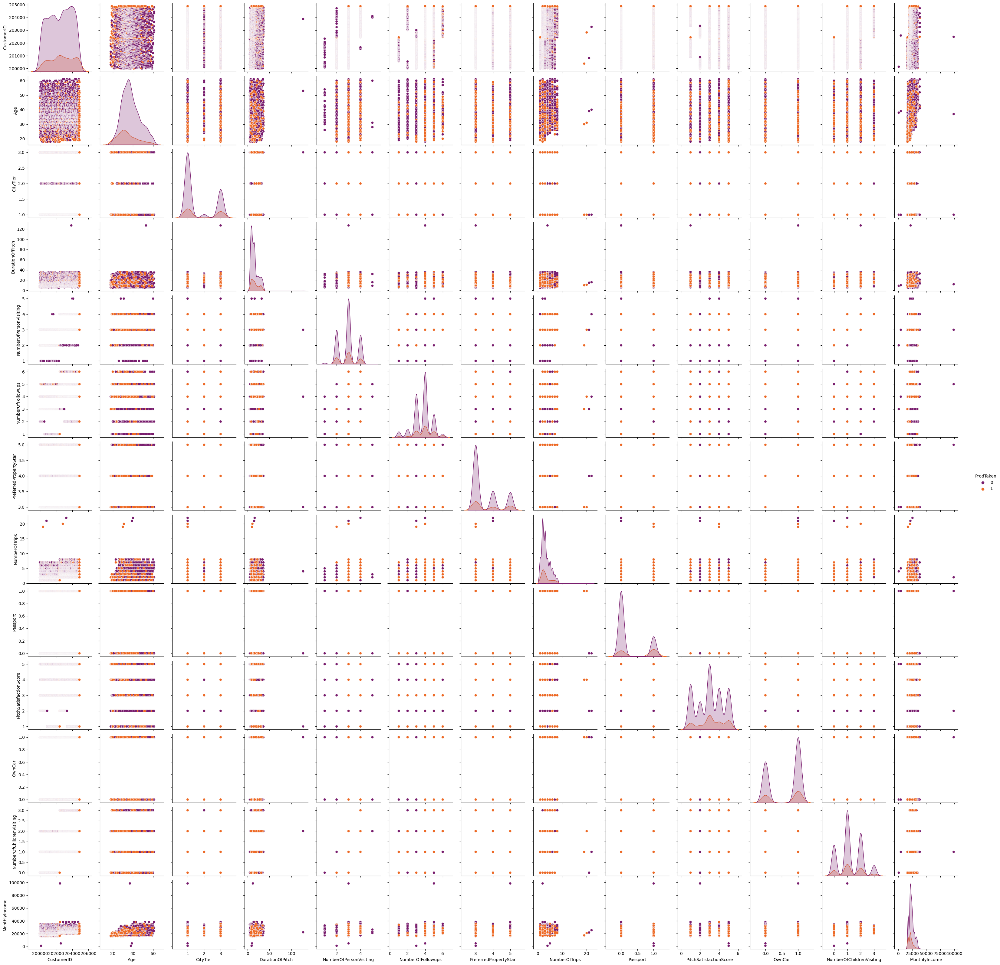

In [17]:
ax=sns.pairplot(data, hue="ProdTaken", palette="inferno")
plt.show() 

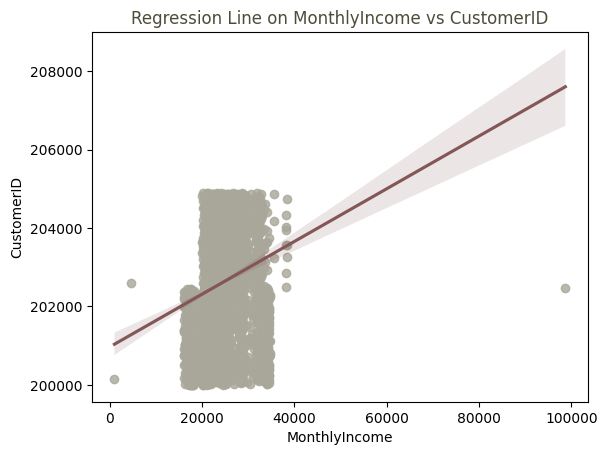

In [18]:
ax=sns.regplot(x="MonthlyIncome", y="CustomerID",data=data, fit_reg=True, scatter_kws={"color":"#a9a799"}, line_kws={"color":"#835658"})
ax.set_title("Regression Line on MonthlyIncome vs CustomerID", color="#4e4c39")
plt.show()

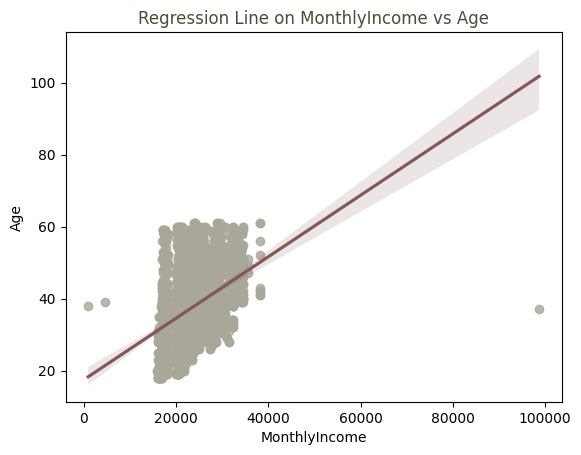

In [19]:
ax=sns.regplot(x="MonthlyIncome", y="Age",data=data, fit_reg=True, scatter_kws={"color":"#a9a799"}, line_kws={"color":"#835658"})
ax.set_title("Regression Line on MonthlyIncome vs Age", color="#4e4c39")
plt.show()

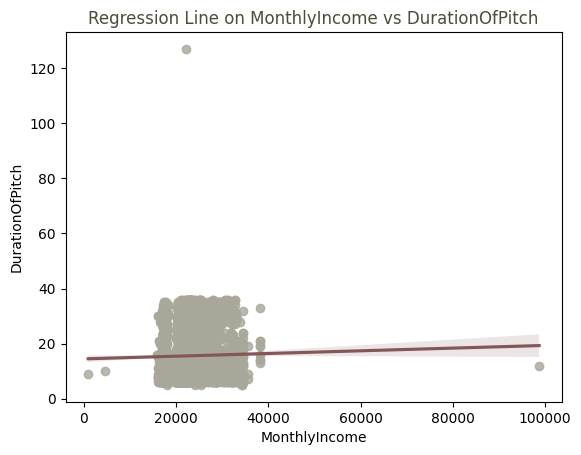

In [20]:
# DurationOfPitch
ax=sns.regplot(x="MonthlyIncome", y="DurationOfPitch",data=data, fit_reg=True, scatter_kws={"color":"#a9a799"}, line_kws={"color":"#835658"})
ax.set_title("Regression Line on MonthlyIncome vs DurationOfPitch", color="#4e4c39")
plt.show()

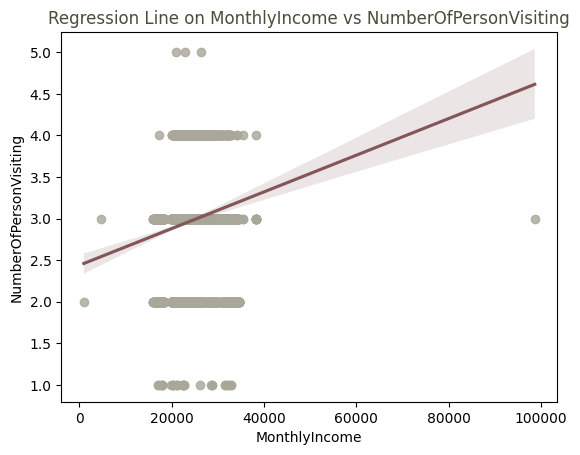

In [21]:
# NumberOfPersonVisiting
ax=sns.regplot(x="MonthlyIncome", y="NumberOfPersonVisiting",data=data, fit_reg=True, scatter_kws={"color":"#a9a799"}, line_kws={"color":"#835658"})
ax.set_title("Regression Line on MonthlyIncome vs NumberOfPersonVisiting", color="#4e4c39")
plt.show()

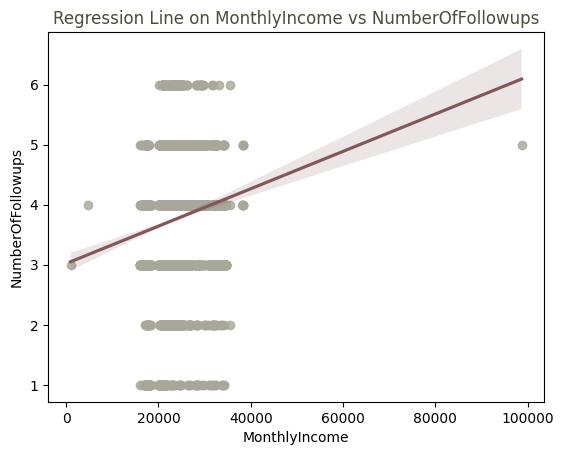

In [22]:
# NumberOfFollowups
ax=sns.regplot(x="MonthlyIncome", y="NumberOfFollowups",data=data, fit_reg=True, scatter_kws={"color":"#a9a799"}, line_kws={"color":"#835658"})
ax.set_title("Regression Line on MonthlyIncome vs NumberOfFollowups", color="#4e4c39")
plt.show()

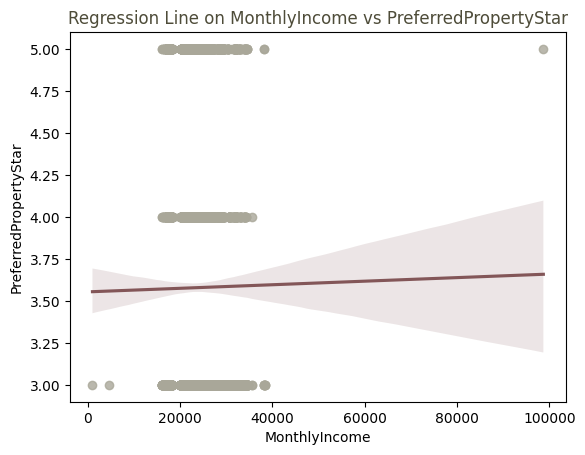

In [23]:
# PreferredPropertyStar
ax=sns.regplot(x="MonthlyIncome", y="PreferredPropertyStar",data=data, fit_reg=True, scatter_kws={"color":"#a9a799"}, line_kws={"color":"#835658"})
ax.set_title("Regression Line on MonthlyIncome vs PreferredPropertyStar", color="#4e4c39")
plt.show()

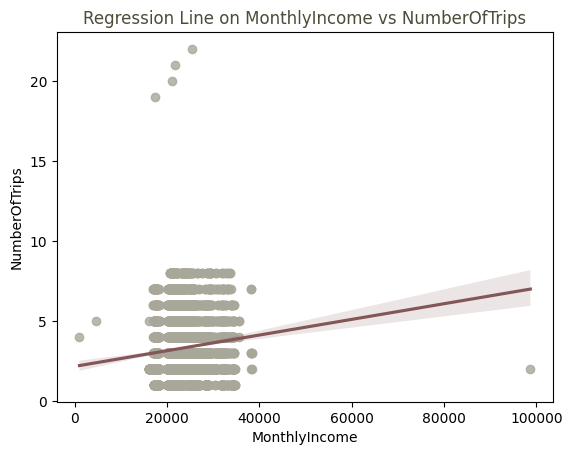

In [24]:
# NumberOfTrips
ax=sns.regplot(x="MonthlyIncome", y="NumberOfTrips",data=data, fit_reg=True, scatter_kws={"color":"#a9a799"}, line_kws={"color":"#835658"})
ax.set_title("Regression Line on MonthlyIncome vs NumberOfTrips", color="#4e4c39")
plt.show()

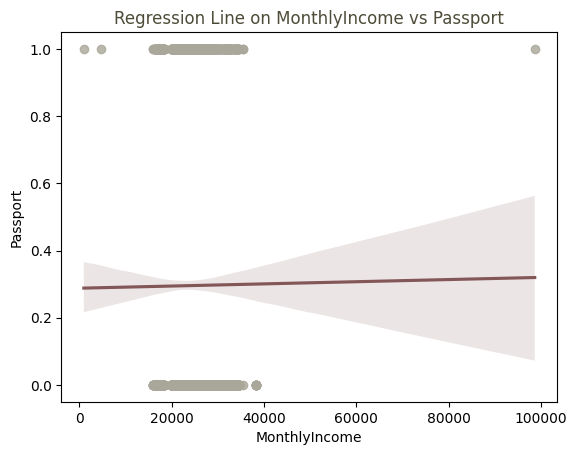

In [25]:
# Passport
ax=sns.regplot(x="MonthlyIncome", y="Passport",data=data, fit_reg=True, scatter_kws={"color":"#a9a799"}, line_kws={"color":"#835658"})
ax.set_title("Regression Line on MonthlyIncome vs Passport", color="#4e4c39")
plt.show()

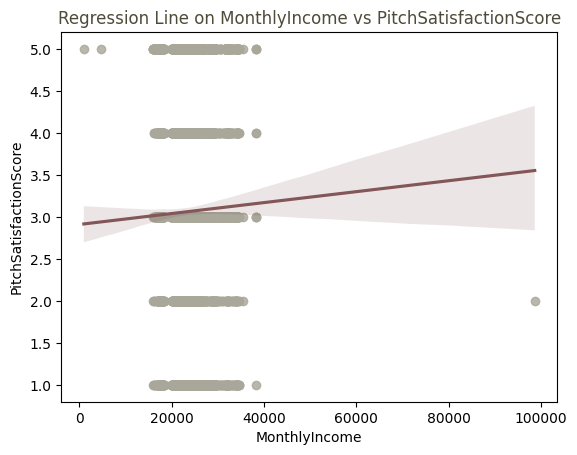

In [26]:
# PitchSatisfactionScore
ax=sns.regplot(x="MonthlyIncome", y="PitchSatisfactionScore",data=data, fit_reg=True, scatter_kws={"color":"#a9a799"}, line_kws={"color":"#835658"})
ax.set_title("Regression Line on MonthlyIncome vs PitchSatisfactionScore", color="#4e4c39")
plt.show()

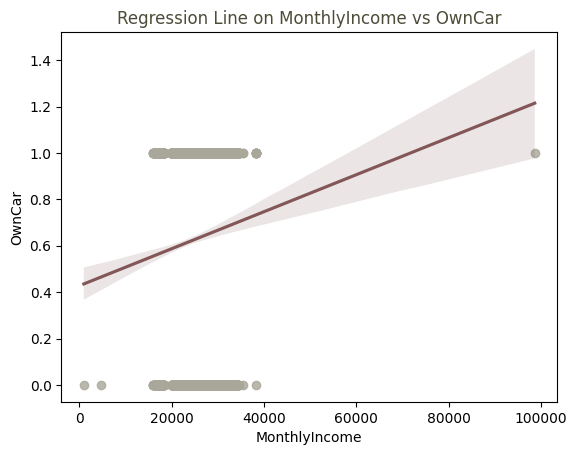

In [27]:
# OwnCar
ax=sns.regplot(x="MonthlyIncome", y="OwnCar",data=data, fit_reg=True, scatter_kws={"color":"#a9a799"}, line_kws={"color":"#835658"})
ax.set_title("Regression Line on MonthlyIncome vs OwnCar", color="#4e4c39")
plt.show()

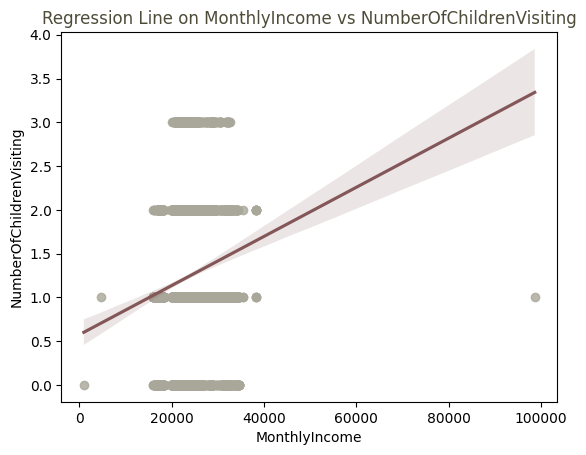

In [28]:
# NumberOfChildrenVisiting
ax=sns.regplot(x="MonthlyIncome", y="NumberOfChildrenVisiting",data=data, fit_reg=True, scatter_kws={"color":"#a9a799"}, line_kws={"color":"#835658"})
ax.set_title("Regression Line on MonthlyIncome vs NumberOfChildrenVisiting", color="#4e4c39")
plt.show()

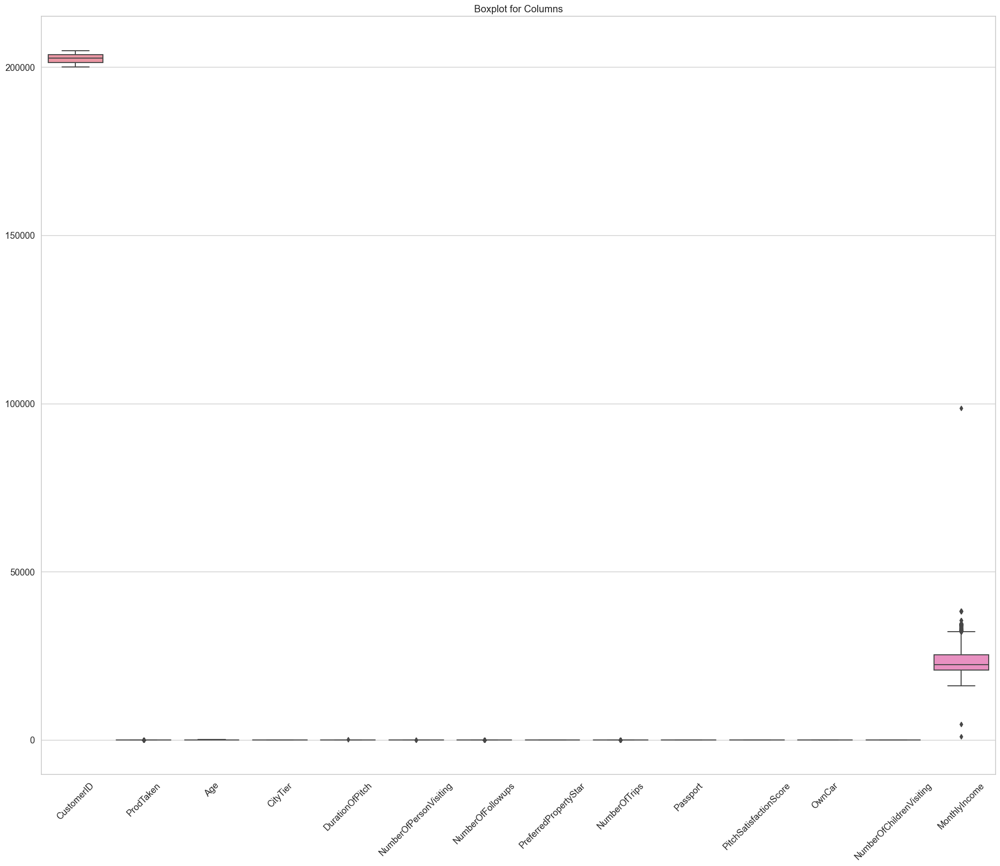

In [29]:
sns.set(style='whitegrid', font_scale=1.2)
plt.figure(figsize=(25,20))
sns.boxplot(data=data, orient='v')
plt.xticks(rotation=45)
plt.title("Boxplot for Columns")
plt.show()




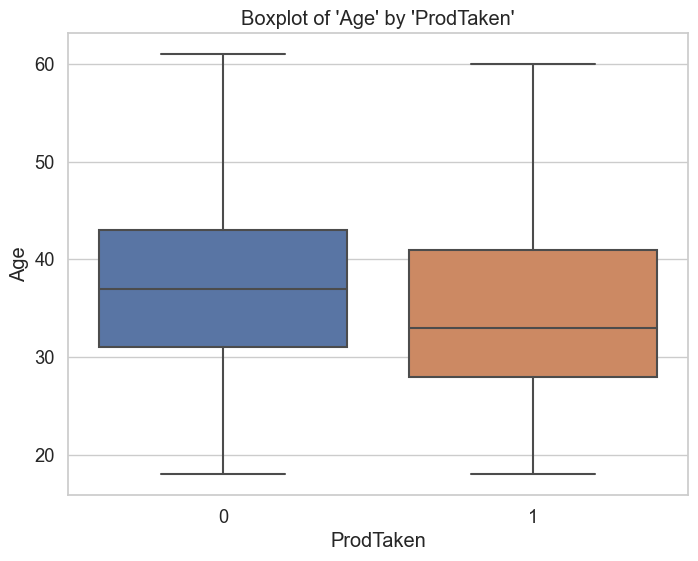

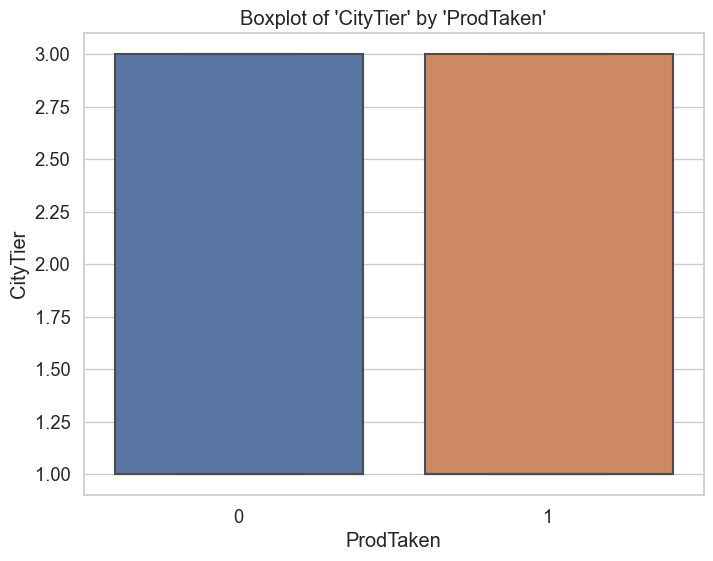

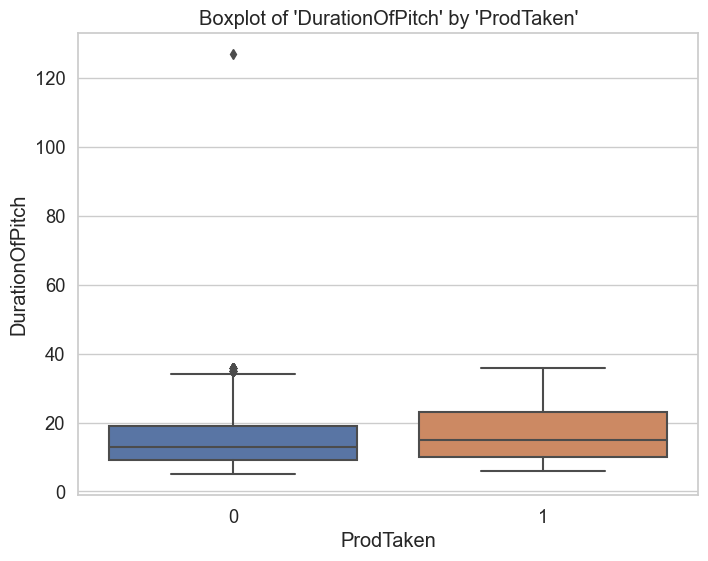

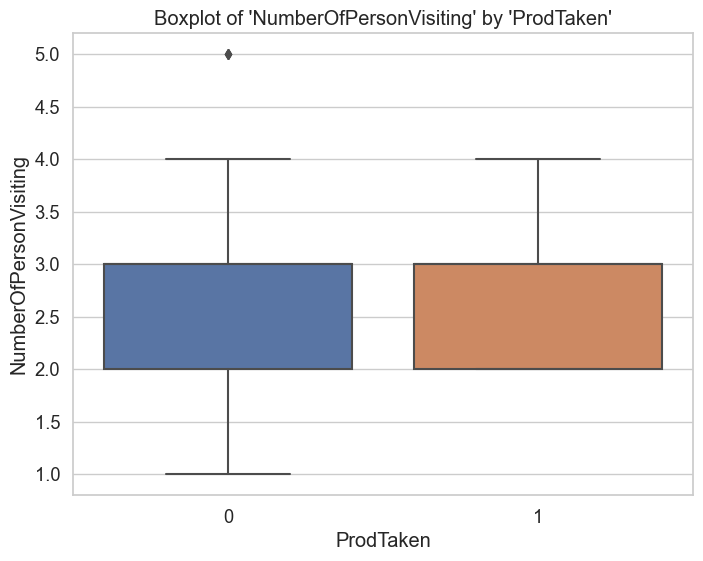

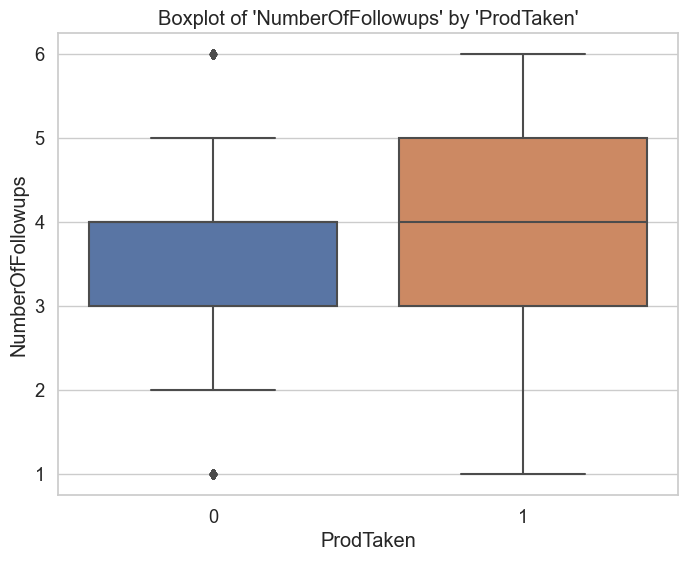

...

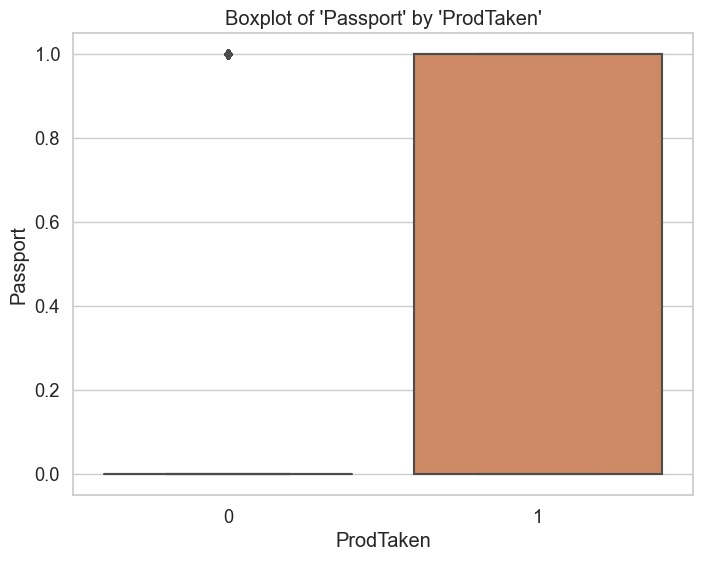

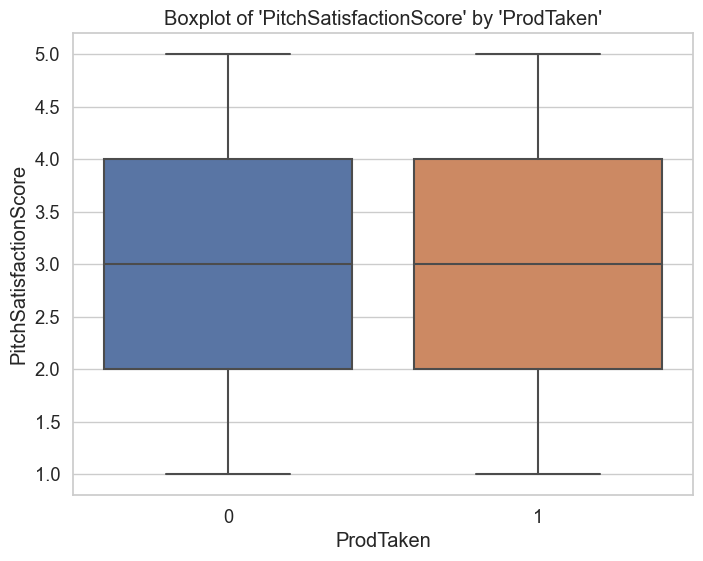

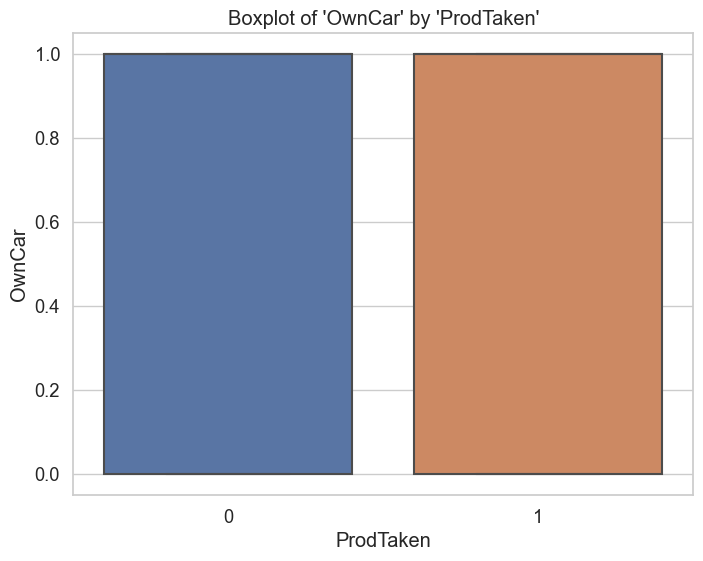

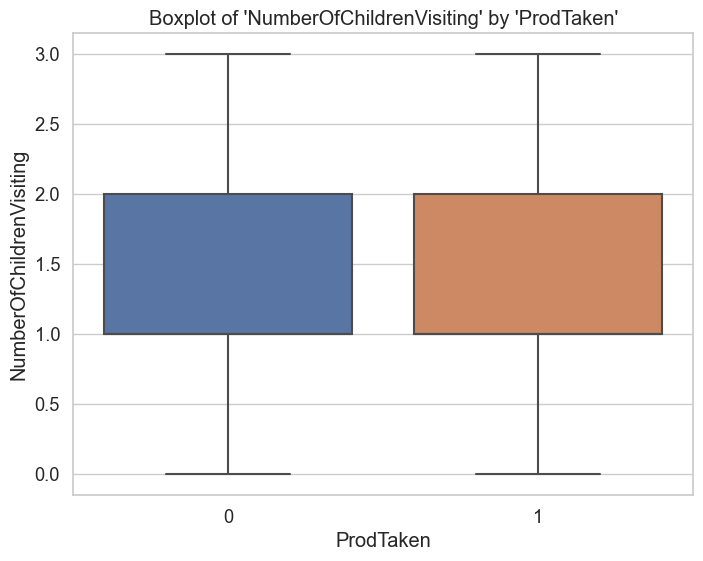

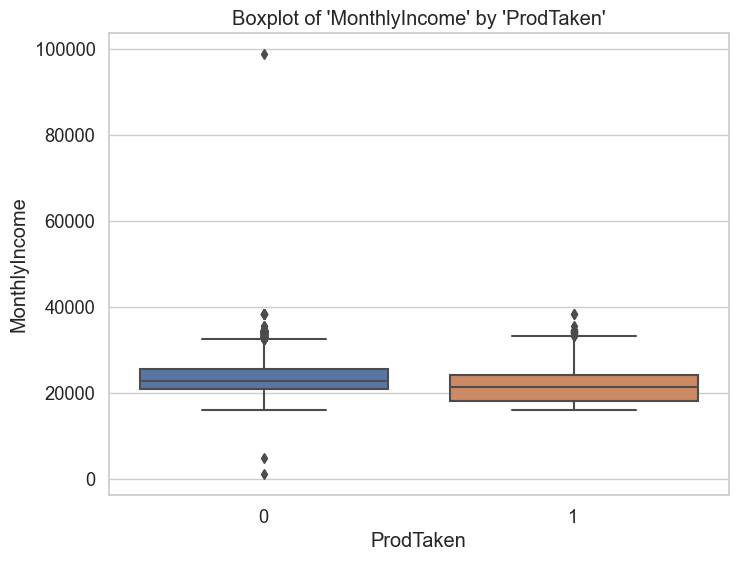

In [30]:
numerical_columns = ['Age', 'CityTier', 'DurationOfPitch', 'NumberOfPersonVisiting',
                     'NumberOfFollowups', 'PreferredPropertyStar', 'NumberOfTrips',
                     'Passport', 'PitchSatisfactionScore', 'OwnCar', 'NumberOfChildrenVisiting',
                     'MonthlyIncome']

sns.set(style='whitegrid', font_scale=1.2)

for column in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='ProdTaken', y=column, data=data)
    plt.title(f"Boxplot of '{column}' by 'ProdTaken'")
    plt.show()

In [ ]:
data.shape

"DurationOfPitch","NumberOfPersonVisiting","NumberOfFollowups","NumberOfTrips","Passport","MonthlyIncome"

# Detecting and removing outliers

C:\Users\Admin\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Admin\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


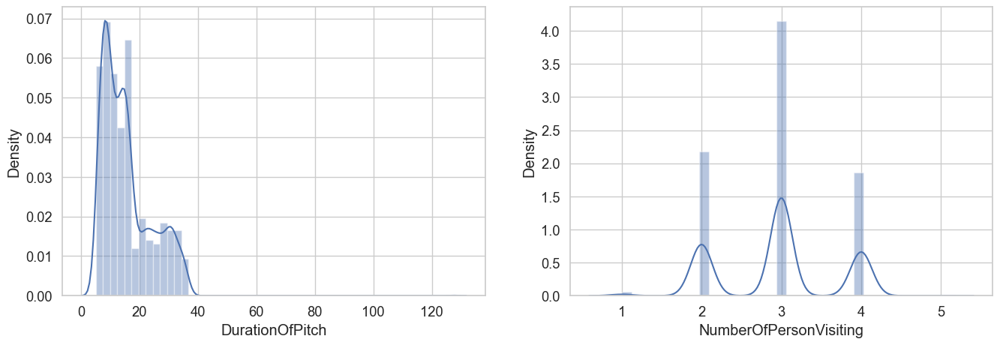

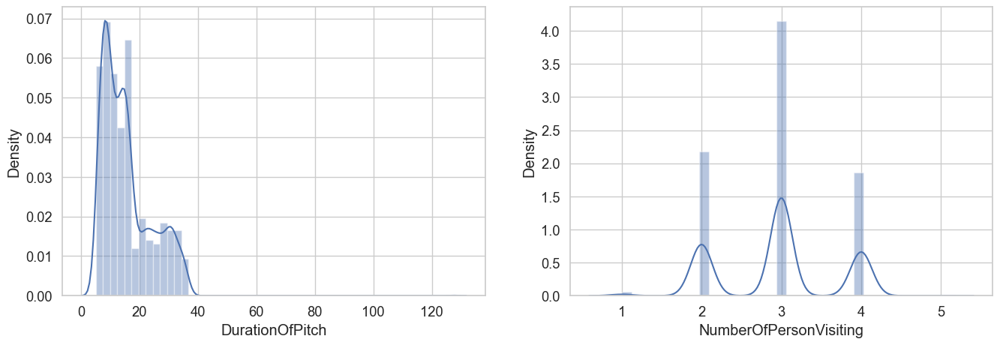

In [32]:
plt.figure(figsize=(16,5))
plt.subplot(1,2,1)
sns.distplot(data['DurationOfPitch'])

plt.subplot(1,2,2)
sns.distplot(data['NumberOfPersonVisiting'])

plt.show()

In [34]:
data[["DurationOfPitch","NumberOfPersonVisiting","NumberOfFollowups","NumberOfTrips","Passport","MonthlyIncome"]].skew()

DurationOfPitch           1.384696
NumberOfPersonVisiting   -0.022566
NumberOfFollowups        -0.403821
NumberOfTrips             1.533037
Passport                  0.897782
MonthlyIncome             1.746316
dtype: float64

In [35]:
data[["DurationOfPitch","NumberOfPersonVisiting","NumberOfFollowups","NumberOfTrips","Passport","MonthlyIncome"]].describe()

,DurationOfPitch,NumberOfPersonVisiting,NumberOfFollowups,NumberOfTrips,Passport,MonthlyIncome
count,4128.000000,4128.000000,4128.000000,4128.0000,4128.000000,4128.000000
mean,15.584787,2.949370,3.741521,3.2953,0.295300,23178.464147
std,8.398142,0.718818,1.006786,1.8563,0.456233,4506.614622
min,5.000000,1.000000,1.000000,1.0000,0.000000,1000.000000
25%,9.000000,2.000000,3.000000,2.0000,0.000000,20751.000000
50%,14.000000,3.000000,4.000000,3.0000,0.000000,22418.000000
75%,20.000000,3.000000,4.000000,4.0000,1.000000,25301.000000
max,127.000000,5.000000,6.000000,22.0000,1.000000,98678.000000


In [39]:
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.distplot(data["DurationOfPitch"])

plt.subplot(2,2,2)
sns.boxplot(data["NumberOfPersonVisiting"])

plt.subplot(2,2,3)
sns.distplot(data["NumberOfFollowups"])

plt.subplot(2,2,4)
sns.boxplot(data["NumberOfTrips"])

plt.subplot(2,2,5)
sns.boxplot(data["Passport"])

plt.subplot(2,2,6)
sns.boxplot(data["MonthlyIncome"])

plt.show()

C:\Users\Admin\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Admin\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Admin\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  w

ValueError: num must be 1 <= num <= 4, not 5

C:\Users\Admin\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Admin\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Admin\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Admin\Anaconda3\lib\si

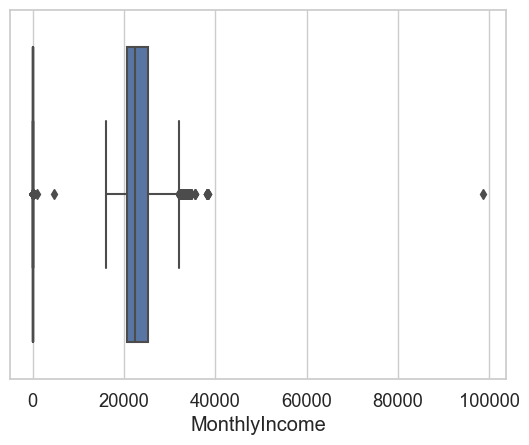

In [37]:
plt.figure(figsize=(16,5))
plt.subplot(1,2,1)
sns.boxplot(data['DurationOfPitch'])

sns.boxplot(data['NumberOfPersonVisiting'])

sns.boxplot(data['NumberOfFollowups'])

sns.boxplot(data['NumberOfTrips'])

sns.boxplot(data['Passport'])

sns.boxplot(data['MonthlyIncome'])

plt.show()

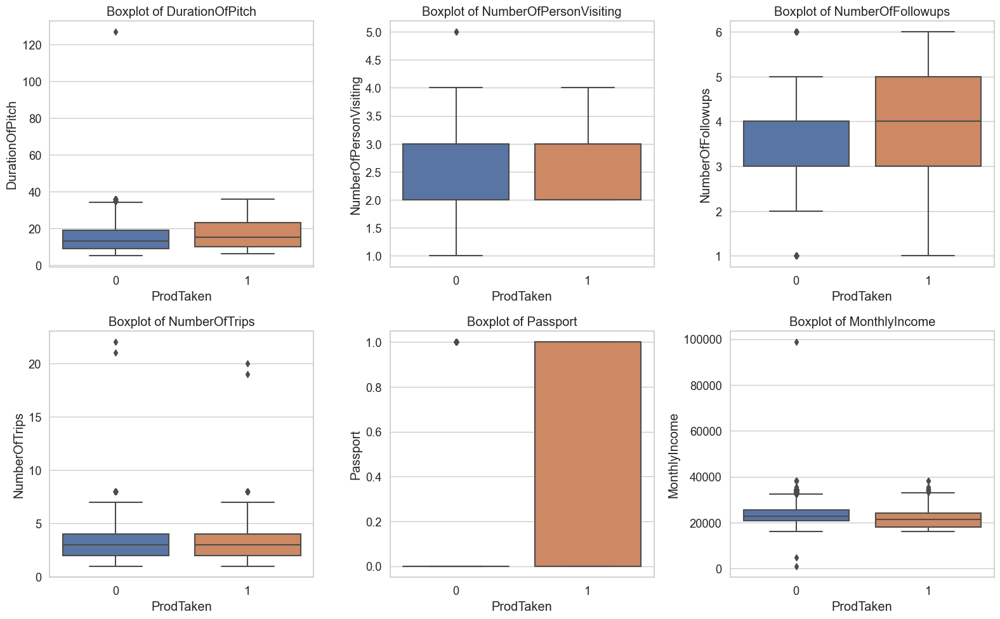

In [45]:
plt.figure(figsize=(16, 10))

# First boxplot
plt.subplot(2, 3, 1)
sns.boxplot(data=data, x="ProdTaken", y="DurationOfPitch")
plt.title("Boxplot of DurationOfPitch")

# Second boxplot
plt.subplot(2, 3, 2)
sns.boxplot(data=data, x="ProdTaken", y="NumberOfPersonVisiting")
plt.title("Boxplot of NumberOfPersonVisiting")

# Third boxplot
plt.subplot(2, 3, 3)
sns.boxplot(data=data, x="ProdTaken", y="NumberOfFollowups")
plt.title("Boxplot of NumberOfFollowups")

# Fourth boxplot
plt.subplot(2, 3, 4)
sns.boxplot(data=data, x="ProdTaken", y="NumberOfTrips")
plt.title("Boxplot of NumberOfTrips")

# Fifth boxplot
plt.subplot(2, 3, 5)
sns.boxplot(data=data, x="ProdTaken", y="Passport")
plt.title("Boxplot of Passport")

# Sixth boxplot
plt.subplot(2, 3, 6)
sns.boxplot(data=data, x="ProdTaken", y="MonthlyIncome")
plt.title("Boxplot of MonthlyIncome")

plt.tight_layout()
plt.show()

# Finding the IQR

# Find the IQR
percentile25=data["DurationOfPitch"].quantile(0.25)
percentile75=data["DurationOfPitch"].quantile(0.75)

In [46]:
def remove_outliers(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

# Create a new DataFrame to store the data without outliers
data_without_outliers = data.copy()

# Remove outliers for each numerical column
for column in numerical_columns:
    data_without_outliers = remove_outliers(data_without_outliers, column)

# Print the number of rows before and after removing outliers
print("Number of rows before removing outliers:", len(data))
print("Number of rows after removing outliers:", len(data_without_outliers))

Number of rows before removing outliers: 4128
Number of rows after removing outliers: 3560


In [52]:
data_without_outliers.shape

(3560, 20)

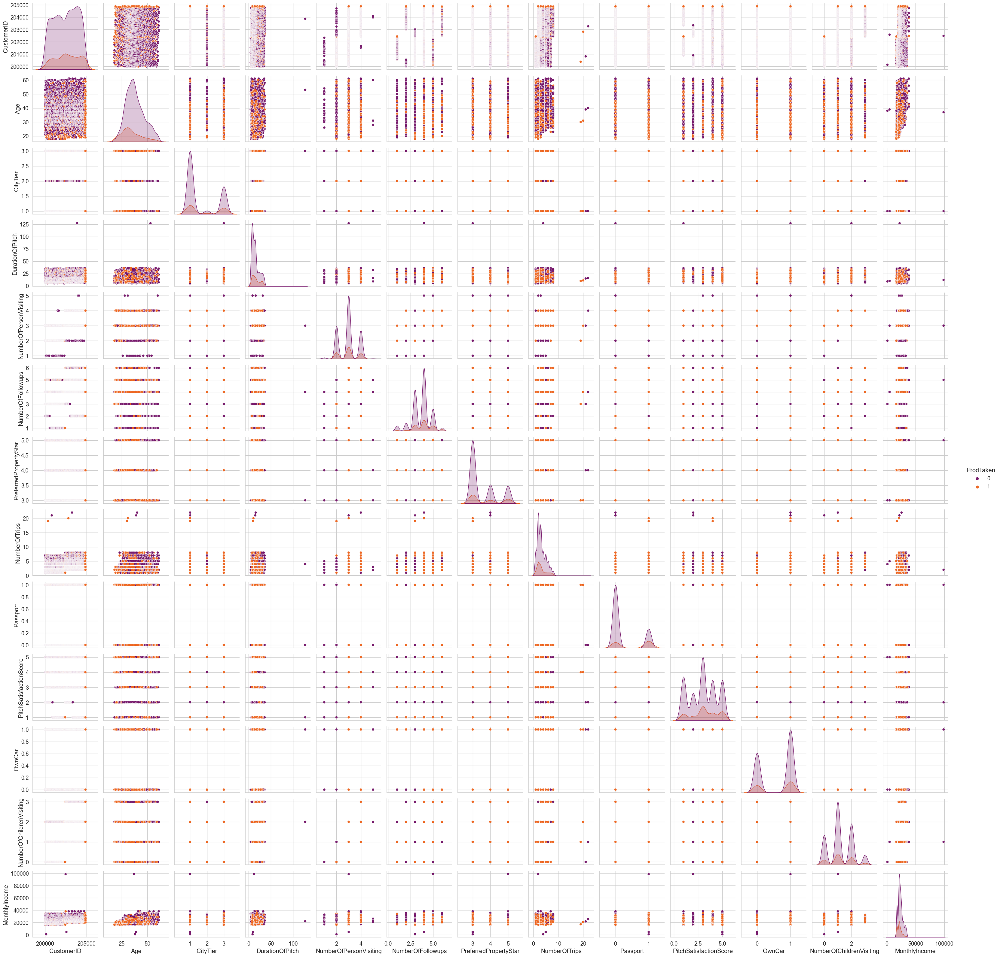

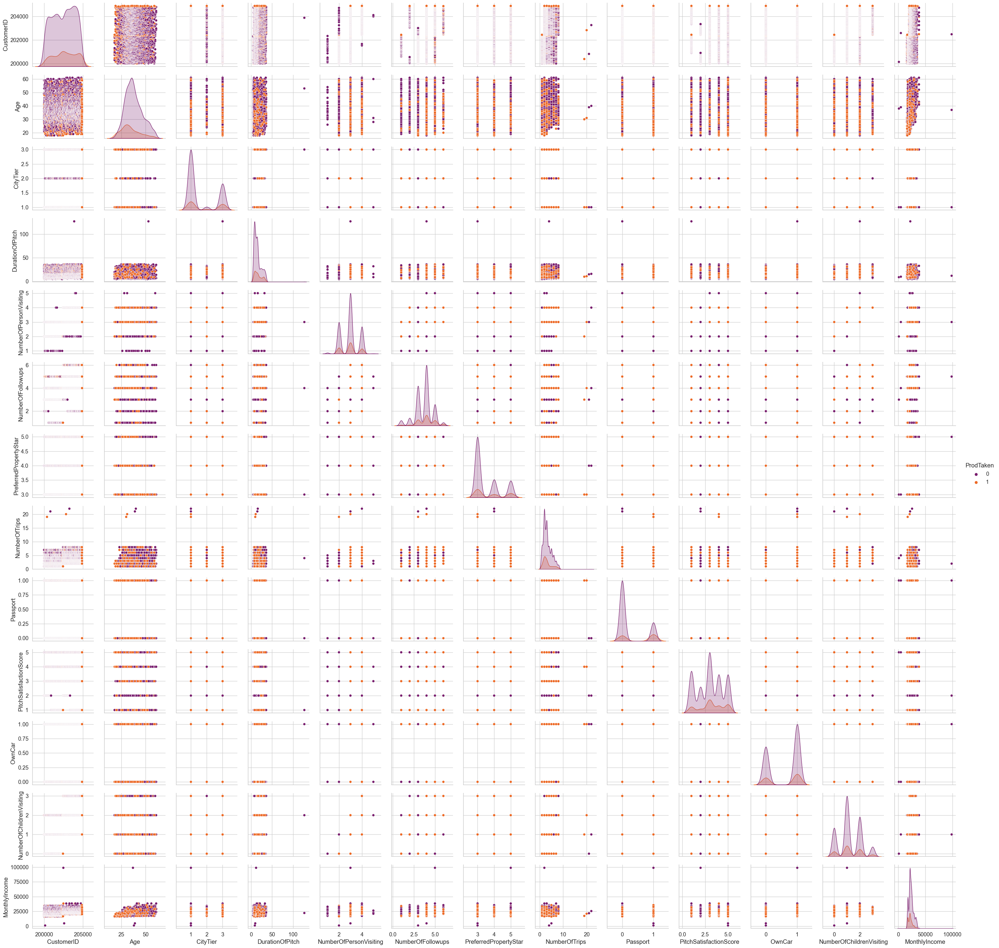

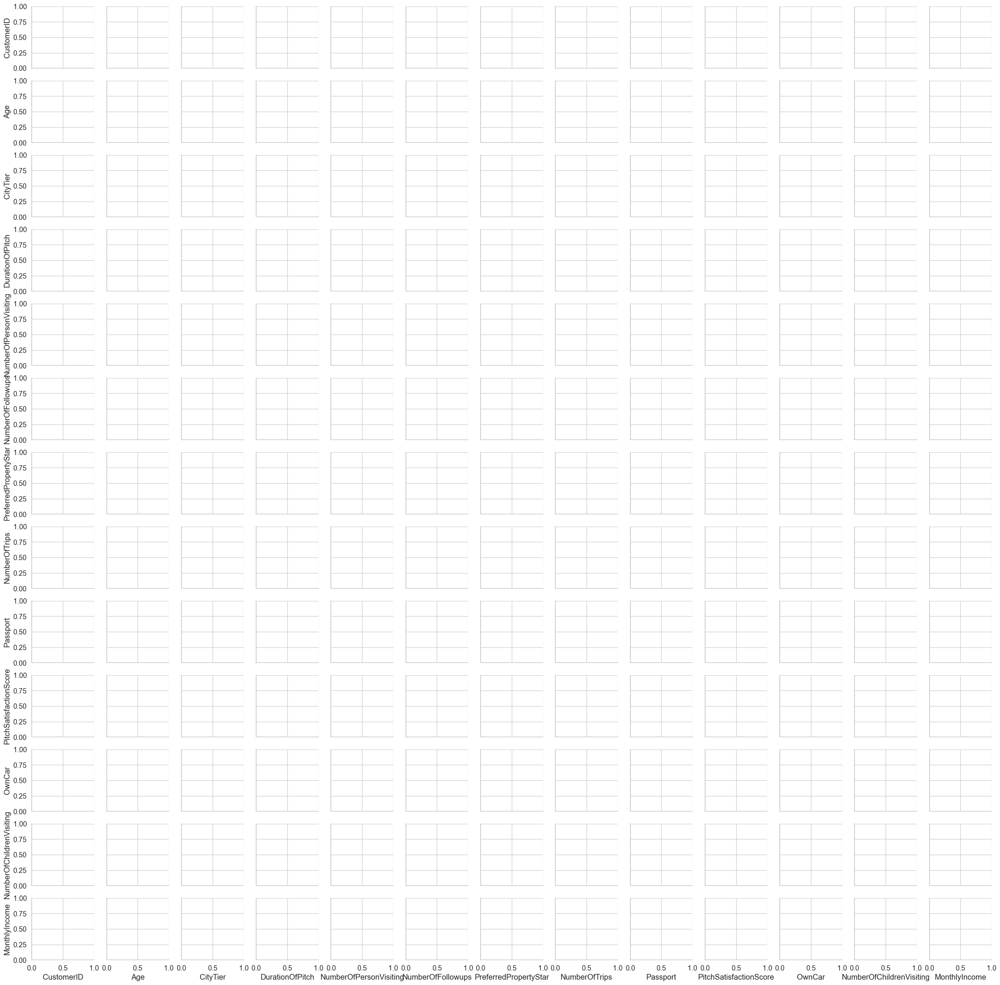

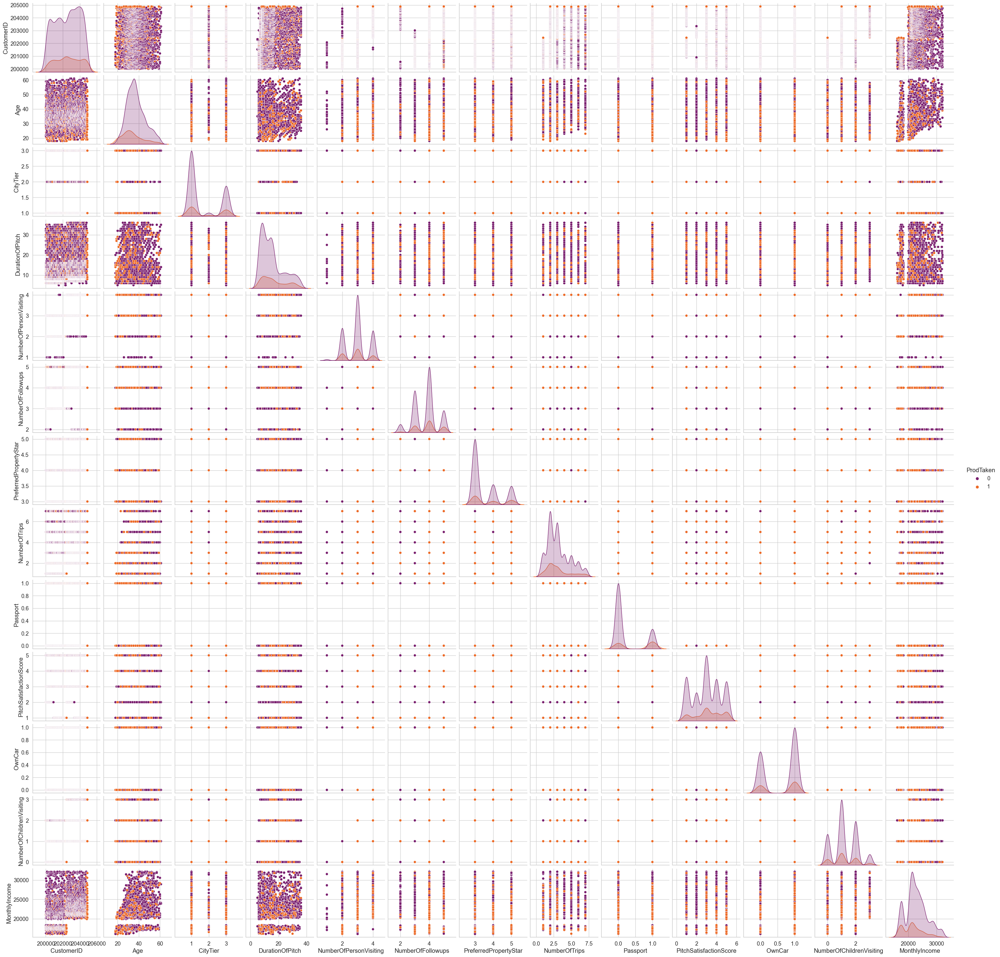

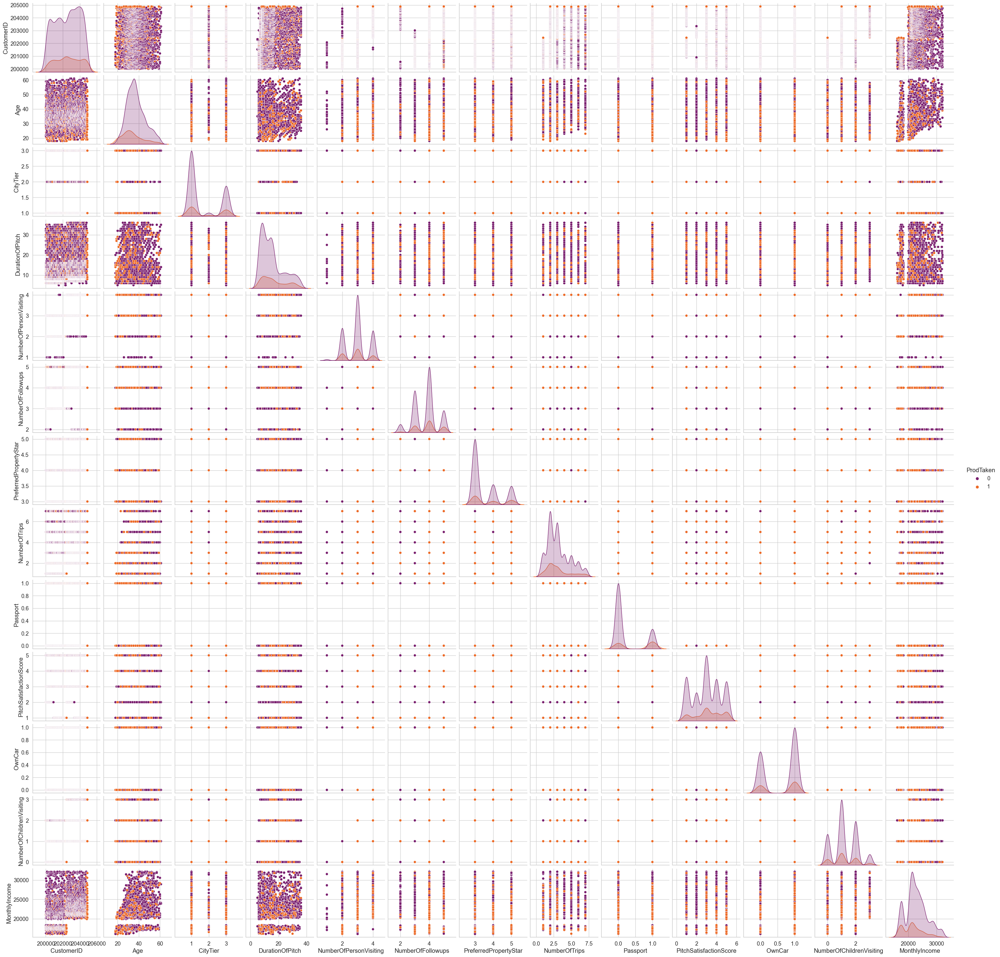

In [55]:
ax=sns.pairplot(data_without_outliers, hue= "ProdTaken",palette="inferno")
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

# deal with the categorical variables.

In [56]:
# Get list of categorical variables
s = (data.dtypes =="object")
object_cols = list(s[s].index)
print("Categorical variables:")
print(object_cols)

Categorical variables:
['TypeofContact', 'Occupation', 'Gender', 'ProductPitched', 'MaritalStatus', 'Designation']


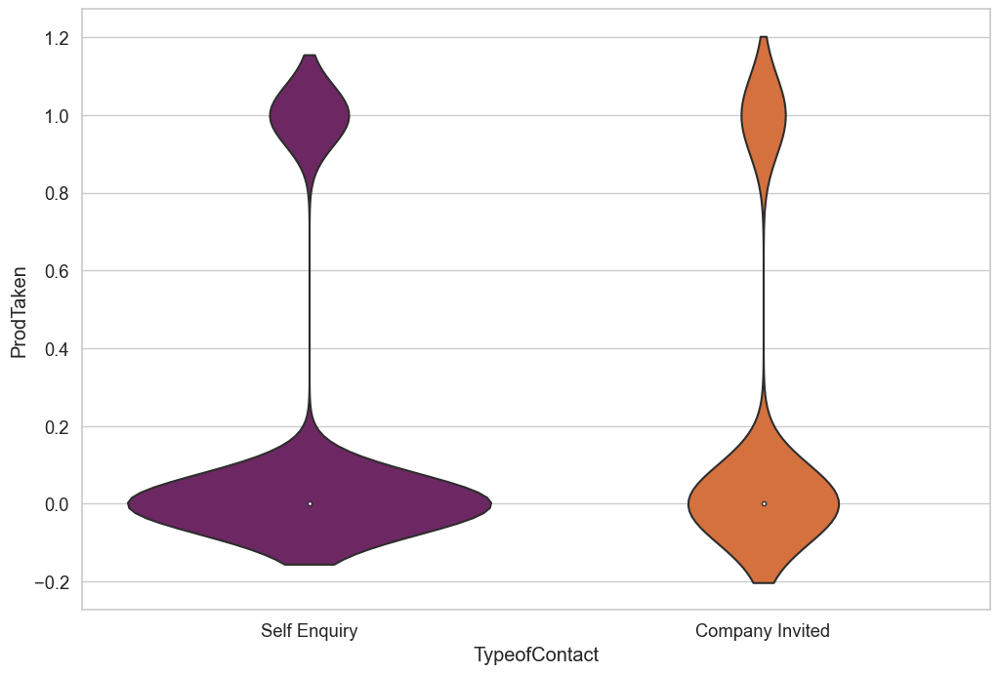

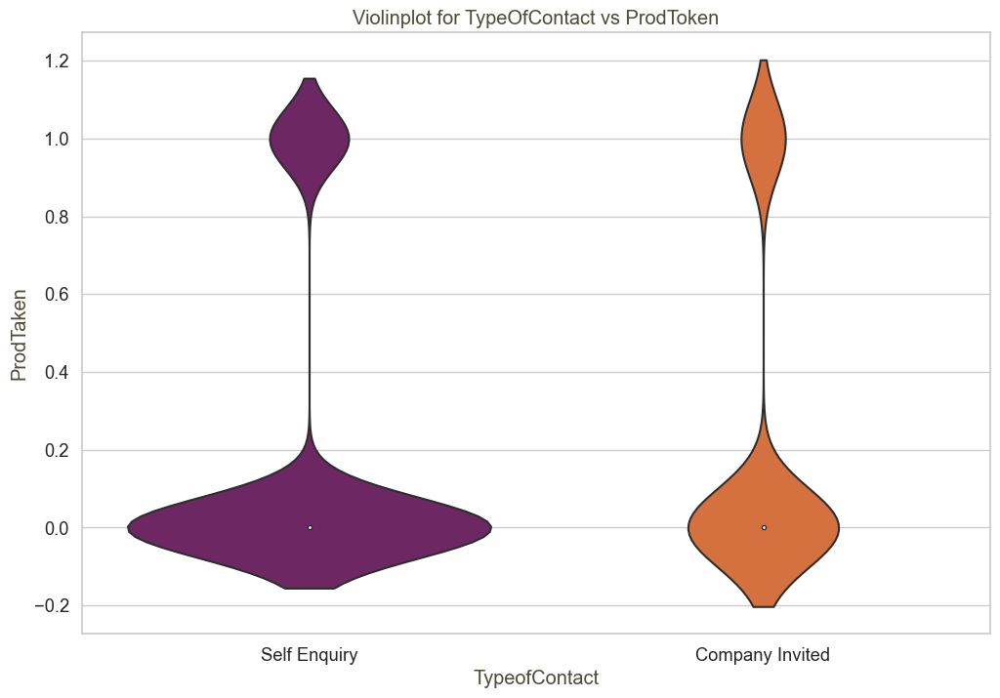

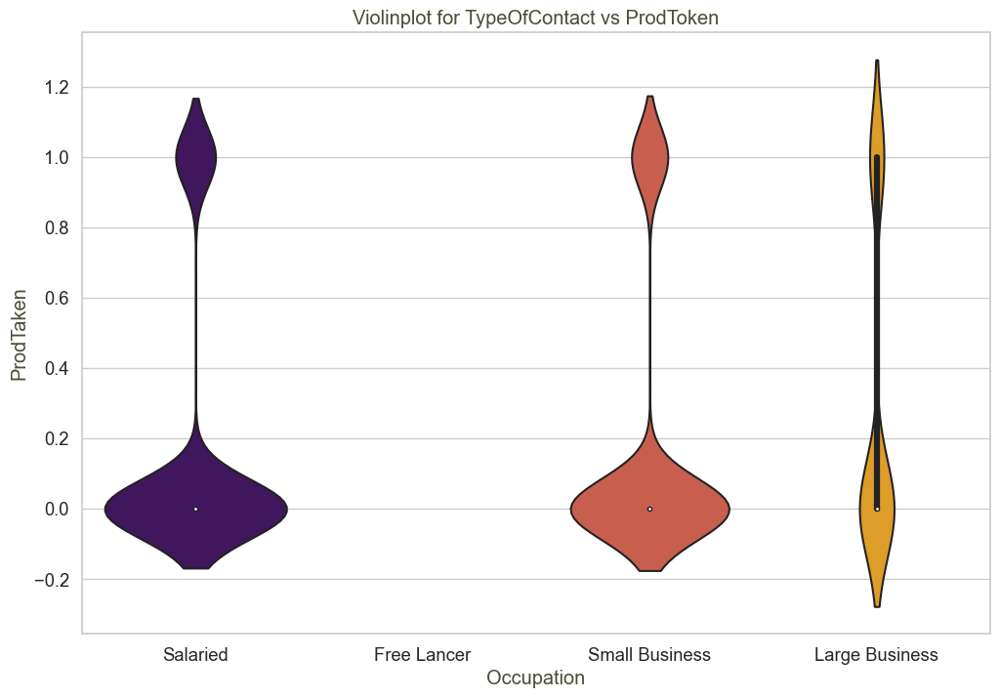

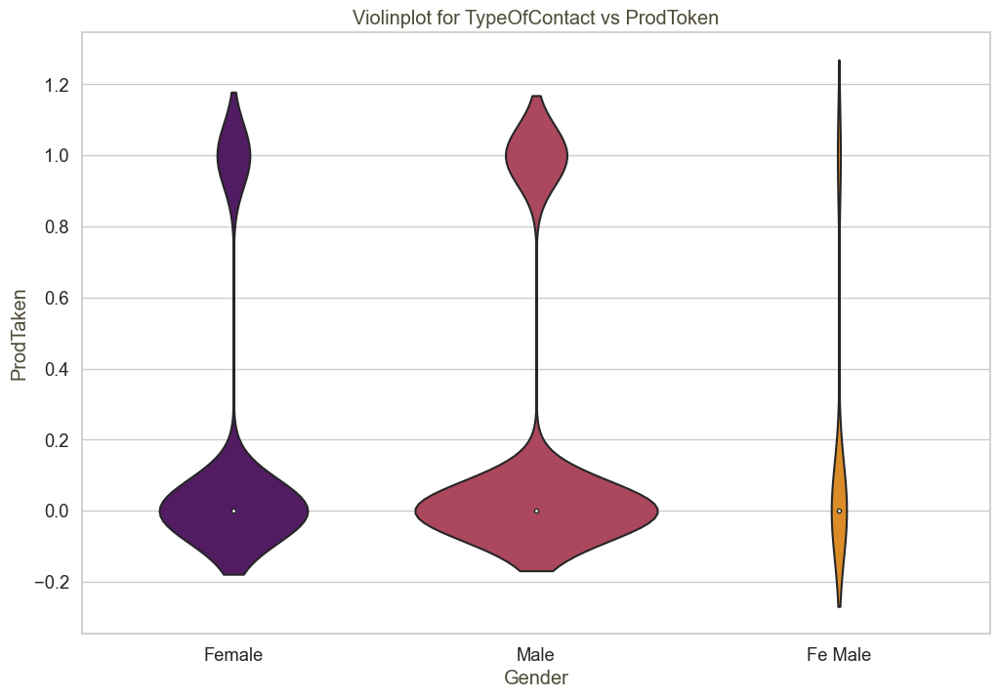

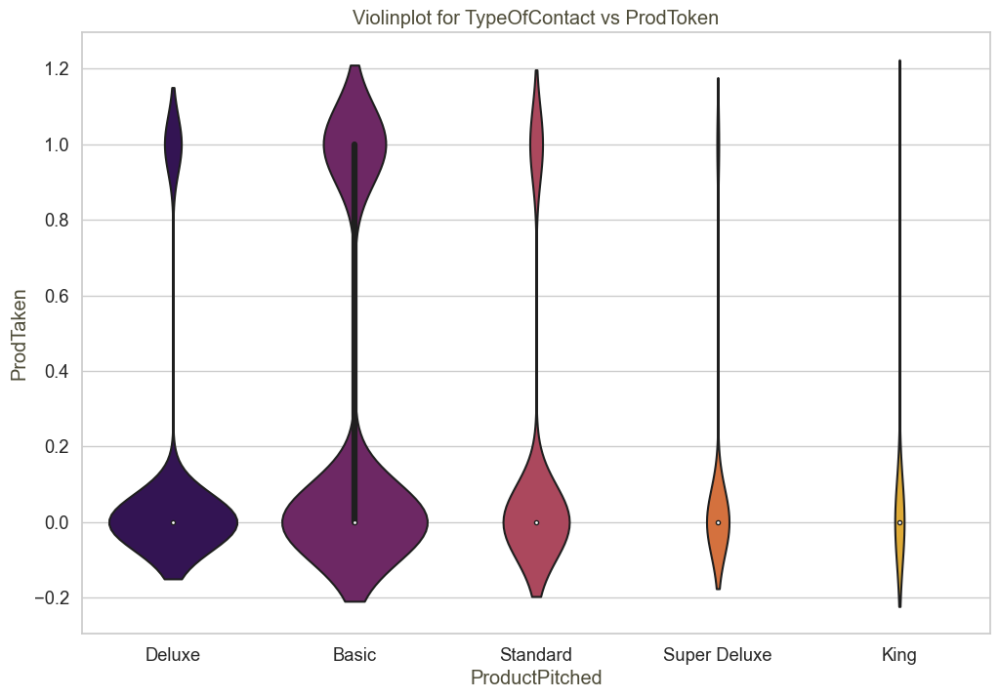

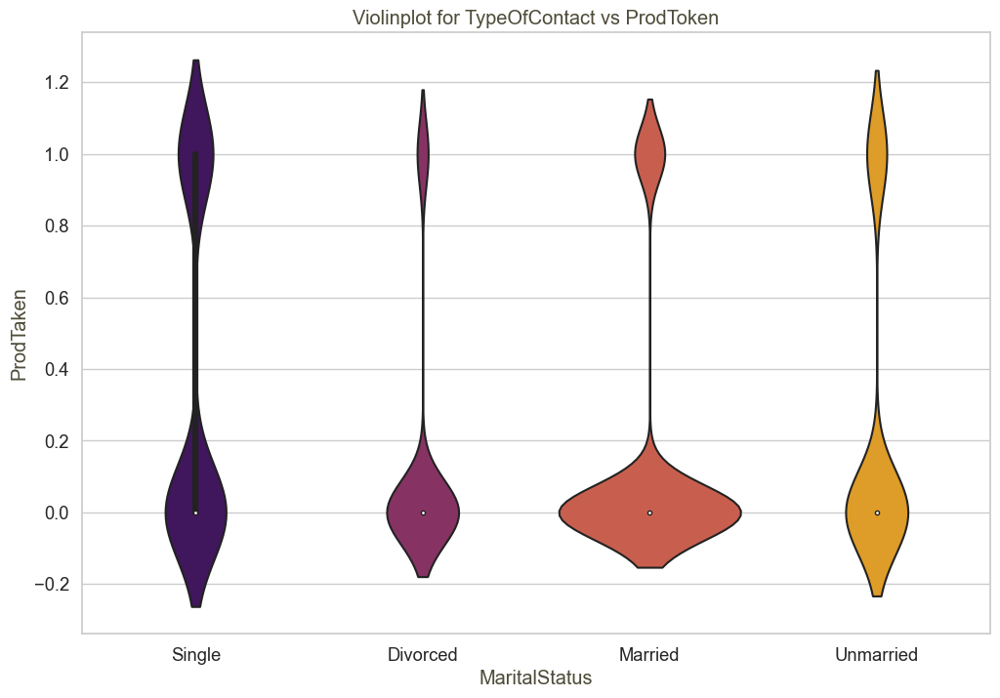

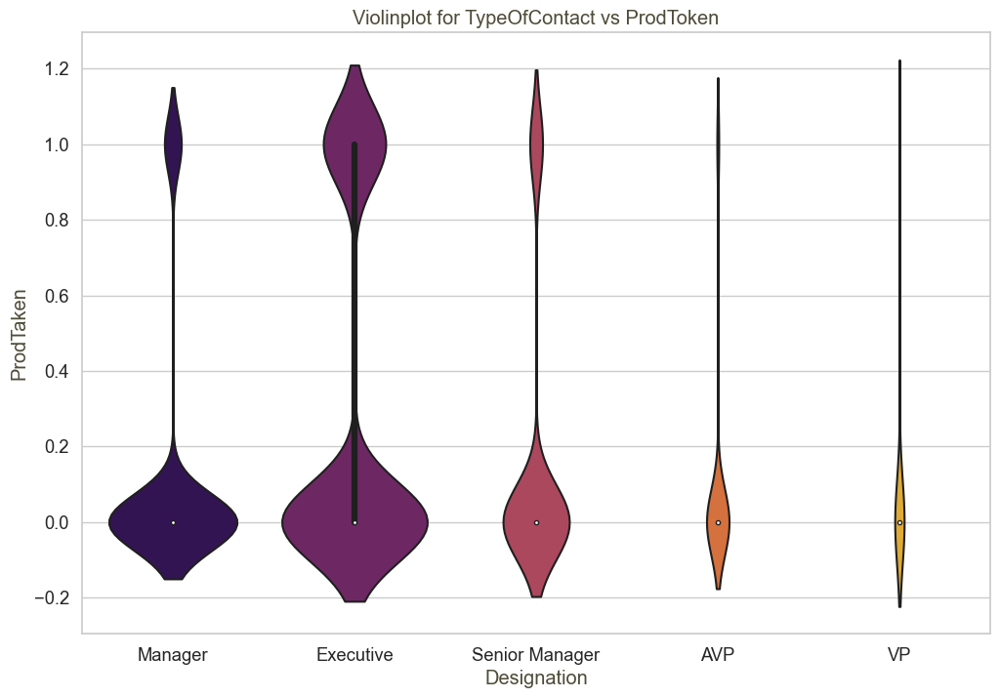

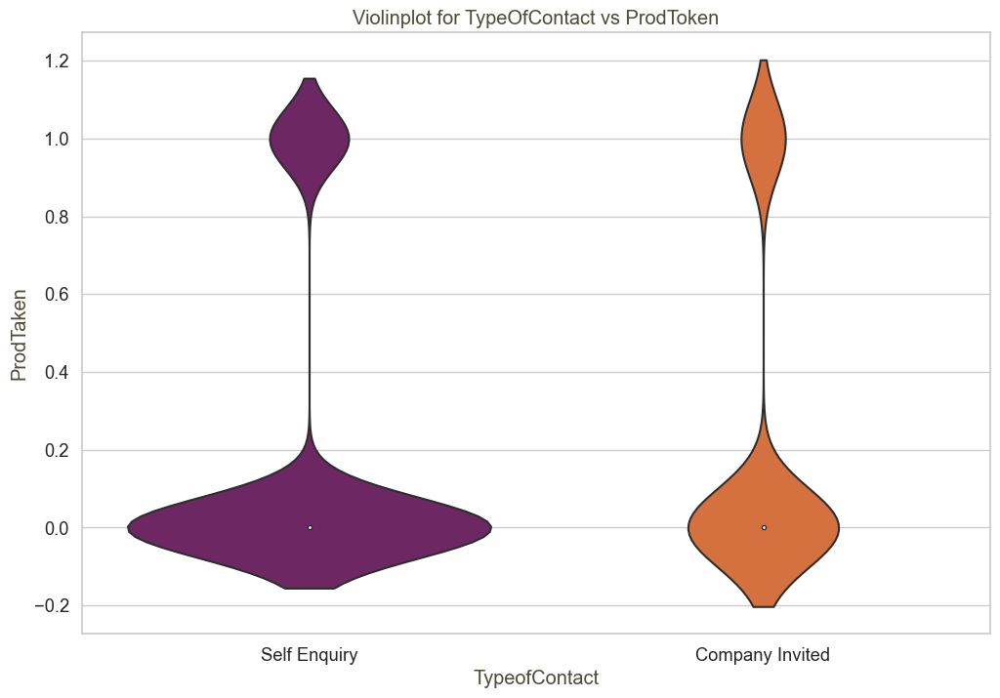

In [64]:
plt.figure(figsize=(12,8))
ax=sns.violinplot(x="TypeofContact", y='ProdTaken', data=data, palette='inferno', scale="count")
ax.set_title("Violinplot for TypeOfContact vs ProdToken", color="#4e4c39")
ax.set_ylabel("ProdTaken", color="#4e4c39")
ax.set_xlabel("TypeofContact", color="#4e4c39")
plt.show()

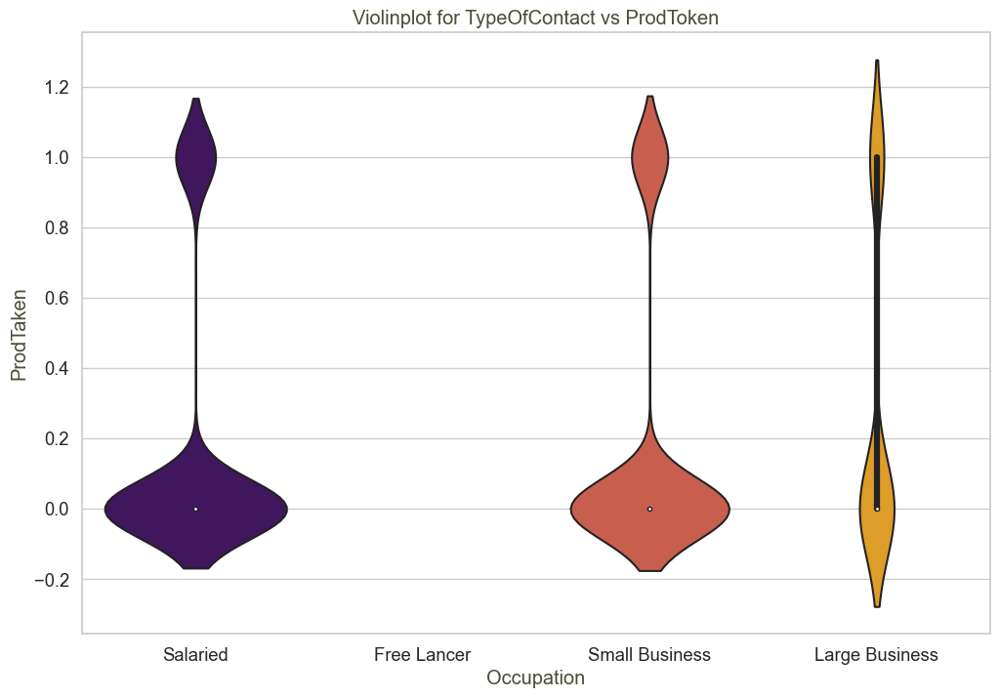

In [65]:
plt.figure(figsize=(12,8))
ax=sns.violinplot(x="Occupation", y='ProdTaken', data=data, palette='inferno', scale="count")
ax.set_title("Violinplot for TypeOfContact vs ProdToken", color="#4e4c39")
ax.set_ylabel("ProdTaken", color="#4e4c39")
ax.set_xlabel("Occupation", color="#4e4c39")
plt.show()

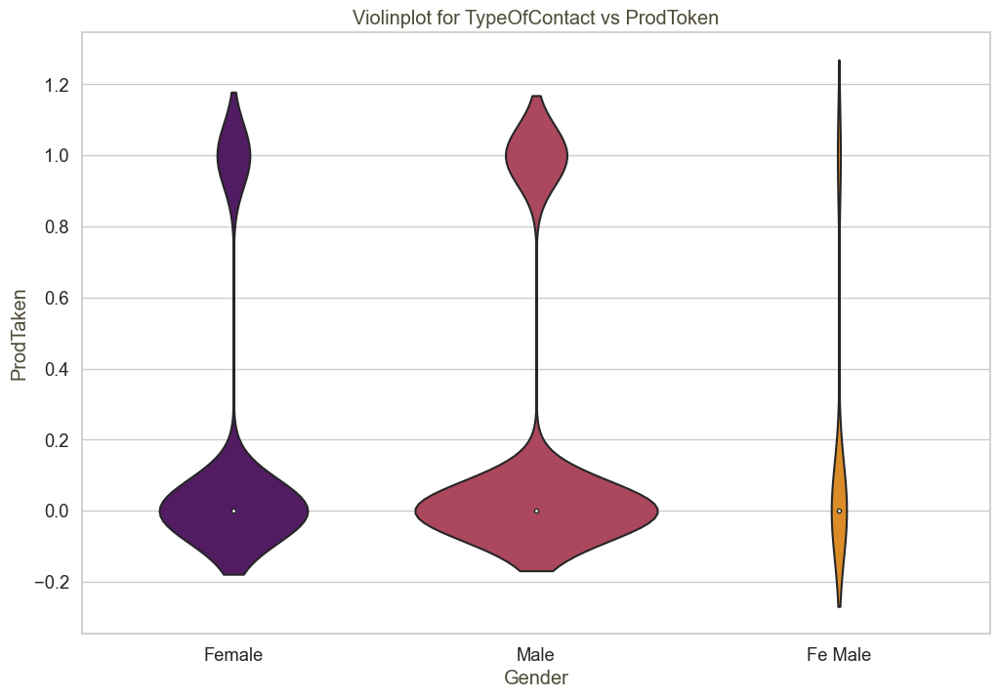

In [66]:
plt.figure(figsize=(12,8))
ax=sns.violinplot(x="Gender", y='ProdTaken', data=data, palette='inferno', scale="count")
ax.set_title("Violinplot for TypeOfContact vs ProdToken", color="#4e4c39")
ax.set_ylabel("ProdTaken", color="#4e4c39")
ax.set_xlabel("Gender", color="#4e4c39")
plt.show()

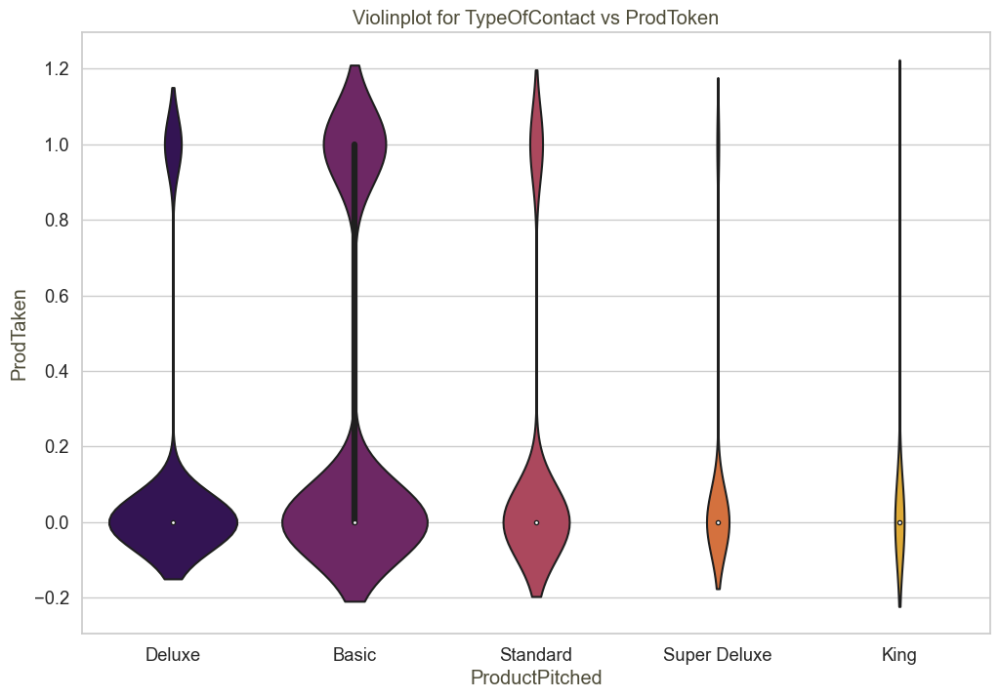

In [67]:
plt.figure(figsize=(12,8))
ax=sns.violinplot(x="ProductPitched", y='ProdTaken', data=data, palette='inferno', scale="count")
ax.set_title("Violinplot for TypeOfContact vs ProdToken", color="#4e4c39")
ax.set_ylabel("ProdTaken", color="#4e4c39")
ax.set_xlabel("ProductPitched", color="#4e4c39")
plt.show()

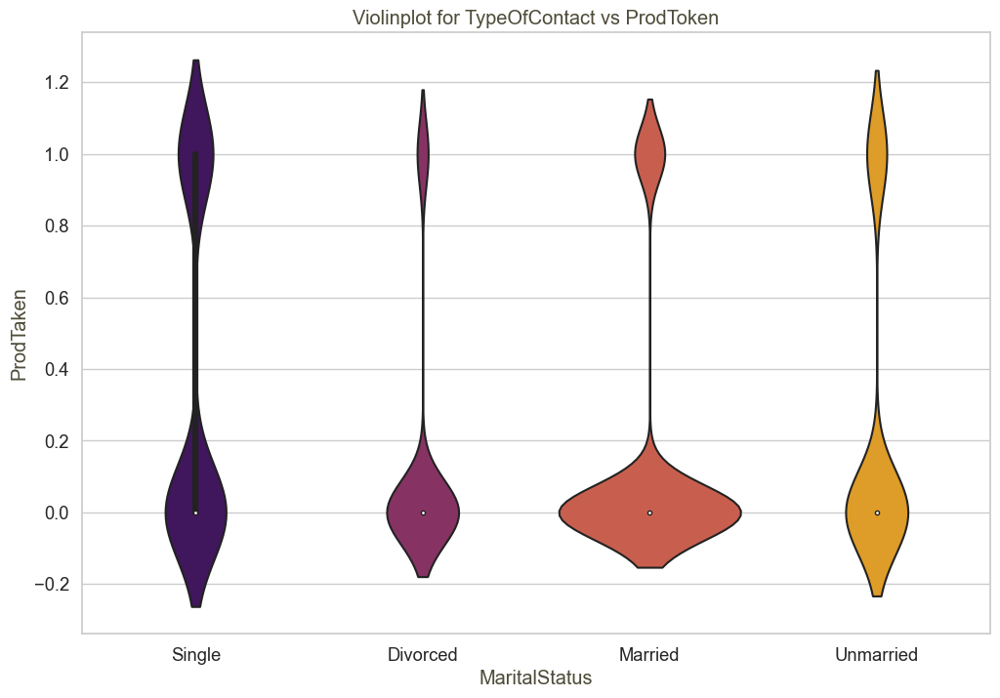

In [68]:
plt.figure(figsize=(12,8))
ax=sns.violinplot(x="MaritalStatus", y='ProdTaken', data=data, palette='inferno', scale="count")
ax.set_title("Violinplot for TypeOfContact vs ProdToken", color="#4e4c39")
ax.set_ylabel("ProdTaken", color="#4e4c39")
ax.set_xlabel("MaritalStatus", color="#4e4c39")
plt.show()

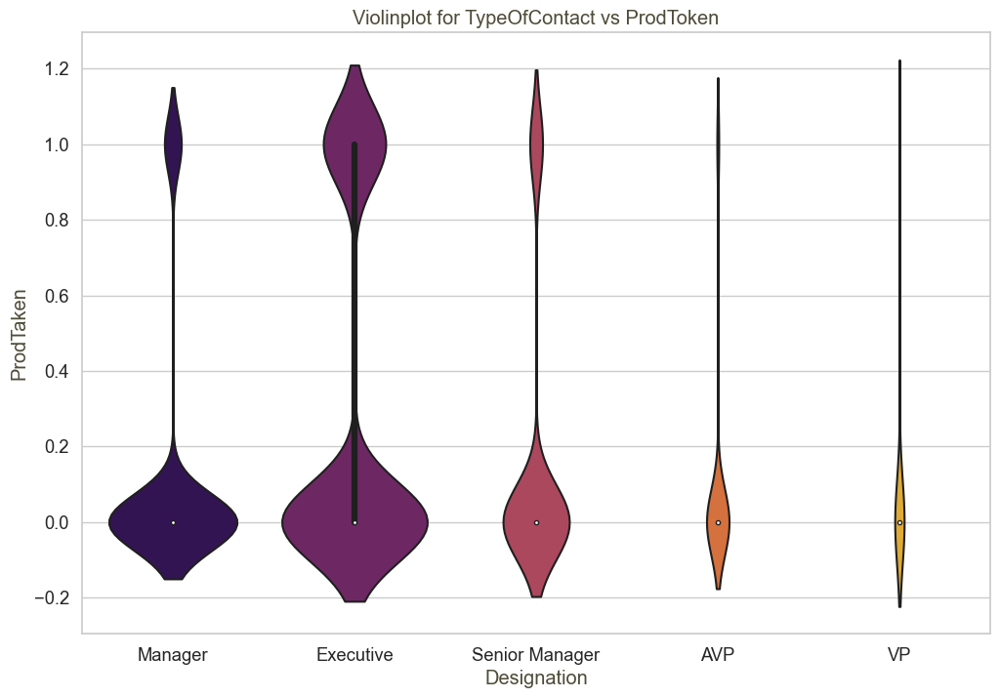

In [69]:
plt.figure(figsize=(12,8))
ax=sns.violinplot(x="Designation", y='ProdTaken', data=data, palette='inferno', scale="count")
ax.set_title("Violinplot for TypeOfContact vs ProdToken", color="#4e4c39")
ax.set_ylabel("ProdTaken", color="#4e4c39")
ax.set_xlabel("Designation", color="#4e4c39")
plt.show()

# Label Encoder

In [71]:
label_data = data.copy()

label_encoder = LabelEncoder()
for col in object_cols:
    label_data[col] = label_encoder.fit_transform(label_data[col])
label_data.head()

,CustomerID,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
0,200000,1,41.0,1,3,6.0,2,1,3,3.0,1,3.0,2,1.0,1,2,1,0.0,2,20993.0
1,200001,0,49.0,0,1,14.0,2,2,3,4.0,1,4.0,0,2.0,0,3,1,2.0,2,20130.0
2,200002,1,37.0,1,1,8.0,0,2,3,4.0,0,3.0,2,7.0,1,3,0,0.0,1,17090.0
3,200003,0,33.0,0,1,9.0,2,1,2,3.0,0,3.0,0,2.0,1,5,1,1.0,1,17909.0
5,200005,0,32.0,0,1,8.0,2,2,3,3.0,0,3.0,2,1.0,0,5,1,1.0,1,18068.0


In [72]:
data.describe()

,CustomerID,ProdTaken,Age,CityTier,DurationOfPitch,NumberOfPersonVisiting,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,MonthlyIncome
count,4128.000000,4128.000000,4128.000000,4128.000000,4128.000000,4128.000000,4128.000000,4128.000000,4128.0000,4128.000000,4128.000000,4128.000000,4128.000000,4128.000000
mean,202527.763808,0.193072,37.231831,1.663275,15.584787,2.949370,3.741521,3.578488,3.2953,0.295300,3.060804,0.612161,1.223595,23178.464147
std,1409.439133,0.394757,9.174521,0.920640,8.398142,0.718818,1.006786,0.795031,1.8563,0.456233,1.363064,0.487317,0.852685,4506.614622
min,200000.000000,0.000000,18.000000,1.000000,5.000000,1.000000,1.000000,3.000000,1.0000,0.000000,1.000000,0.000000,0.000000,1000.000000
25%,201320.750000,0.000000,31.000000,1.000000,9.000000,2.000000,3.000000,3.000000,2.0000,0.000000,2.000000,0.000000,1.000000,20751.000000
50%,202603.500000,0.000000,36.000000,1.000000,14.000000,3.000000,4.000000,3.000000,3.0000,0.000000,3.000000,1.000000,1.000000,22418.000000
75%,203748.250000,0.000000,43.000000,3.000000,20.000000,3.000000,4.000000,4.000000,4.0000,1.000000,4.000000,1.000000,2.000000,25301.000000
max,204887.000000,1.000000,61.000000,3.000000,127.000000,5.000000,6.000000,5.000000,22.0000,1.000000,5.000000,1.000000,3.000000,98678.000000


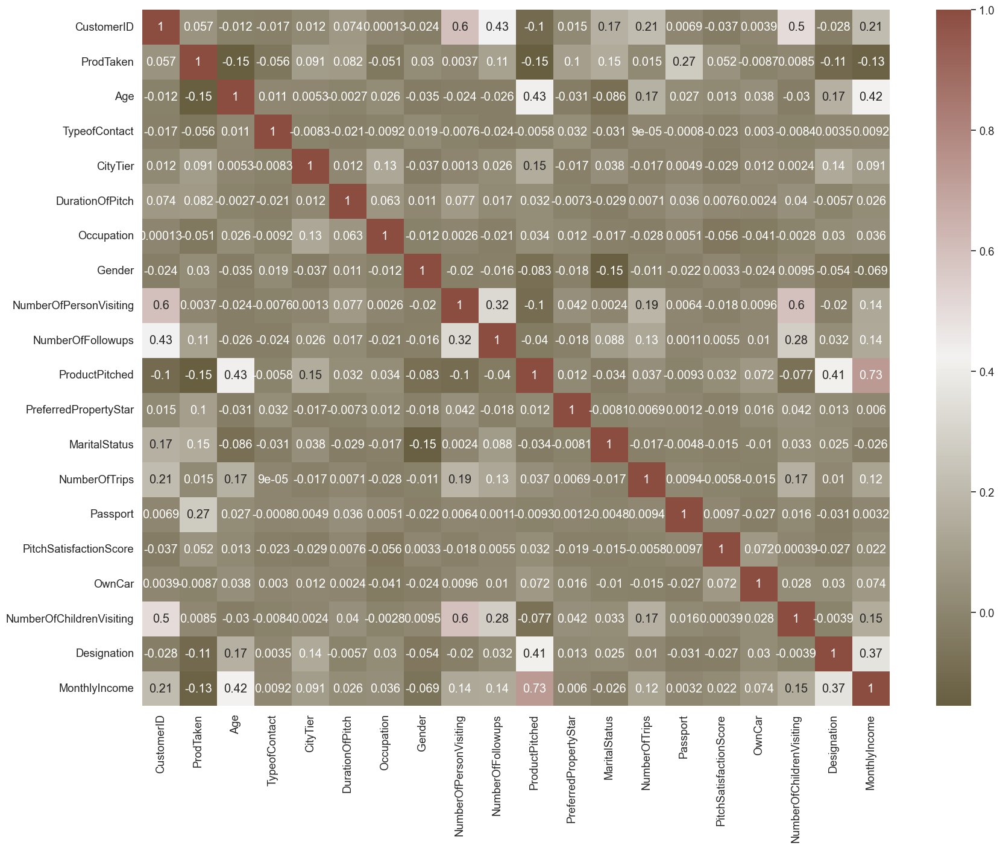

In [77]:
# Correlation Matrix
cmap = sns.diverging_palette(70,20,s=50,l=40,n=6, as_cmap=True)
corrmat=label_data.corr()
f, ax = plt.subplots(figsize=(20,15))
sns.heatmap(corrmat,cmap=cmap,annot=True)
plt.show()

# Model Building

Steps involved in Model Building

1. Setting up features and target
2. Build a pipeline of standard scalar and model for five different regressors.
3. Fit all the models on training data
4. Get mean of cross-validation on the training set for all the models for negative root mean square error
5. Pick the model with the best cross-validation score
6. Fit the best model on the training set and get

In [79]:
X=label_data.drop(["ProdTaken"], axis=1)
y=label_data["ProdTaken"]

In [80]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=7)

In [81]:
# Building pipelins of standard scaler and model for varios regressors.

pipeline_lr=Pipeline([("scalar1",StandardScaler()),
                     ("lr_classifier",LinearRegression())])

pipeline_dt=Pipeline([("scalar2",StandardScaler()),
                     ("dt_classifier",DecisionTreeRegressor())])

pipeline_rf=Pipeline([("scalar3",StandardScaler()),
                     ("rf_classifier",RandomForestRegressor())])


pipeline_kn=Pipeline([("scalar4",StandardScaler()),
                     ("rf_classifier",KNeighborsRegressor())])


pipeline_xgb=Pipeline([("scalar5",StandardScaler()),
                     ("rf_classifier",XGBRegressor())])

# List of all the pipelines
pipelines = [pipeline_lr, pipeline_dt, pipeline_rf, pipeline_kn, pipeline_xgb]

# Dictionary of pipelines and model types for ease of reference
pipe_dict = {0: "LinearRegression", 1: "DecisionTree", 2: "RandomForest",3: "KNeighbors", 4: "XGBRegressor"}

# Fit the pipelines
for pipe in pipelines:
    pipe.fit(X_train, y_train)

In [82]:
cv_results_rms = []
for i, model in enumerate(pipelines):
    cv_score = cross_val_score(model, X_train,y_train,scoring="neg_root_mean_squared_error", cv=10)
    cv_results_rms.append(cv_score)
    print("%s: %f " % (pipe_dict[i], cv_score.mean()))

LinearRegression: -0.365022 
DecisionTree: -0.325239 
RandomForest: -0.256691 
KNeighbors: -0.310314 
XGBRegressor: -0.262836 


# PREDICTION FOR TEST DATA

In [83]:
# Model prediction on test data
pred = pipeline_xgb.predict(X_test)

In [84]:
# Model Evaluation
print("R^2:",metrics.r2_score(y_test, pred))
print("Adjusted R^2:",1 - (1-metrics.r2_score(y_test, pred))*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1))
print("MAE:",metrics.mean_absolute_error(y_test, pred))
print("MSE:",metrics.mean_squared_error(y_test, pred))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, pred)))

R^2: 0.5948950263169579
Adjusted R^2: 0.587289300526466
MAE: 0.15671463640714237
MSE: 0.05985376689996543
RMSE: 0.24465029511522243
